<a href="https://colab.research.google.com/github/nysapk/robotvision-onboarding/blob/main/Robotvision_Onboarding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!mkdir -p /data/sets/nuscenes

!wget https://www.nuscenes.org/data/v1.0-mini.tgz

!tar -xf v1.0-mini.tgz -C /data/sets/nuscenes

!pip install "numpy<2" --upgrade
!pip install nuscenes-devkit --upgrade

--2025-09-25 16:31:42--  https://www.nuscenes.org/data/v1.0-mini.tgz
Resolving www.nuscenes.org (www.nuscenes.org)... 13.33.67.103, 13.33.67.54, 13.33.67.67, ...
Connecting to www.nuscenes.org (www.nuscenes.org)|13.33.67.103|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4167696325 (3.9G) [application/x-tar]
Saving to: ‘v1.0-mini.tgz.1’

v1.0-mini.tgz.1     100%[===================>]   3.88G   206MB/s    in 25s     

2025-09-25 16:32:08 (156 MB/s) - ‘v1.0-mini.tgz.1’ saved [4167696325/4167696325]



In [2]:
from nuscenes.nuscenes import NuScenes
import matplotlib.pyplot as plt

dataroot = '/data/sets/nuscenes'

# load mini dataset
nusc = NuScenes(version='v1.0-mini', dataroot=dataroot, verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.640 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [3]:
# look at available scenes
print("Number of scenes:", len(nusc.scene))
print("First scene info:", nusc.scene[0])


Number of scenes: 10
First scene info: {'token': 'cc8c0bf57f984915a77078b10eb33198', 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2', 'nbr_samples': 39, 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5', 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0', 'name': 'scene-0061', 'description': 'Parked truck, construction, intersection, turn left, following a van'}


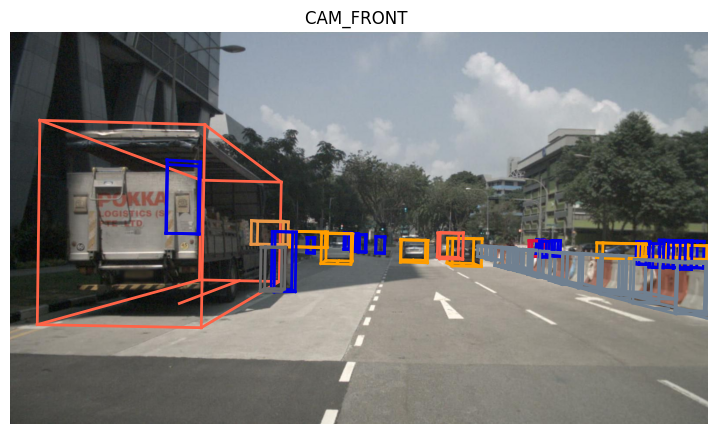

In [4]:
scene = nusc.scene[0]
sample = nusc.get('sample', scene['first_sample_token'])

cam_token = sample['data']['CAM_FRONT']

# show image with annotations
nusc.render_sample_data(cam_token, with_anns=True, axes_limit=40)

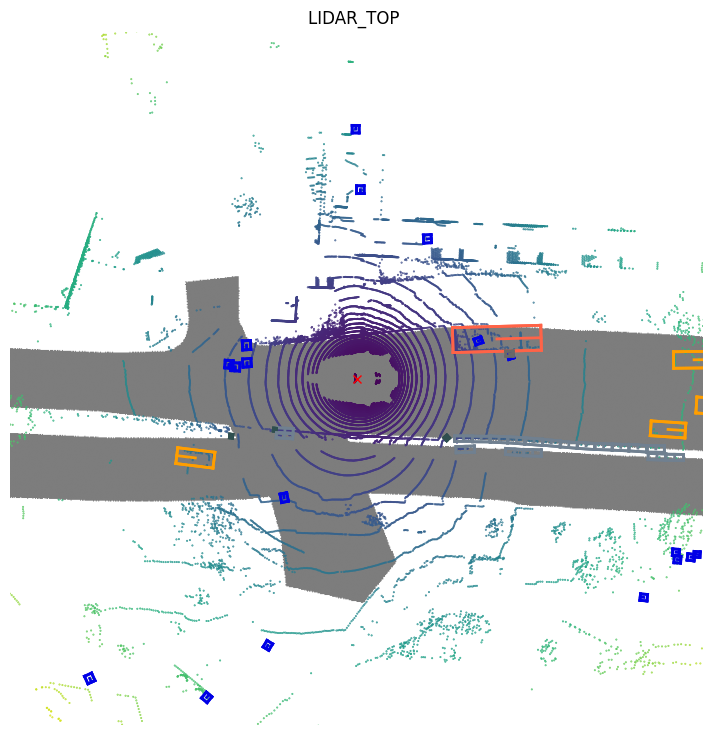

In [5]:
lidar_token = sample['data']['LIDAR_TOP']
nusc.render_sample_data(lidar_token, with_anns=True, axes_limit=40)

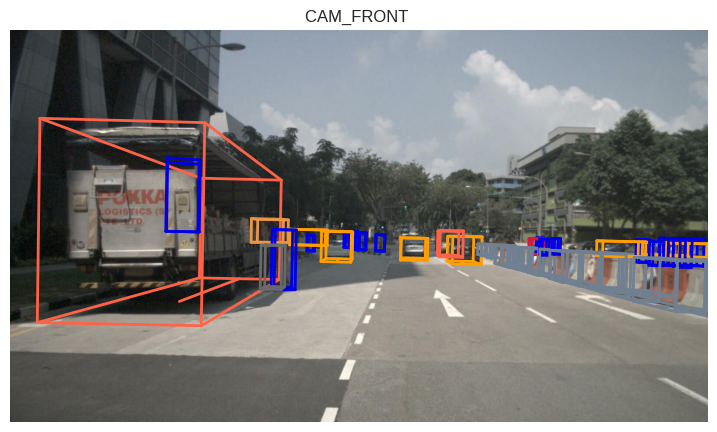

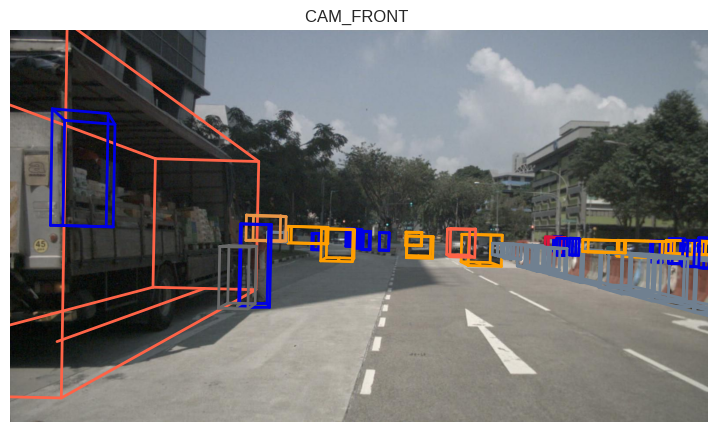

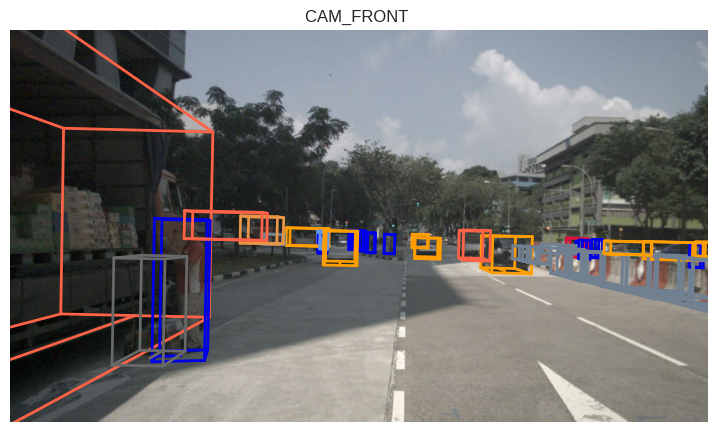

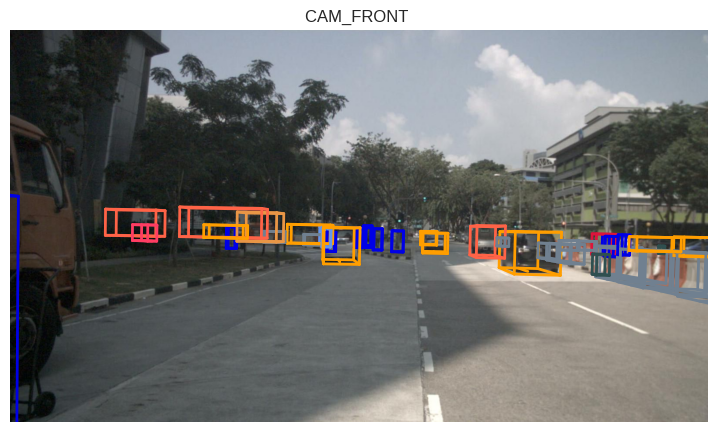

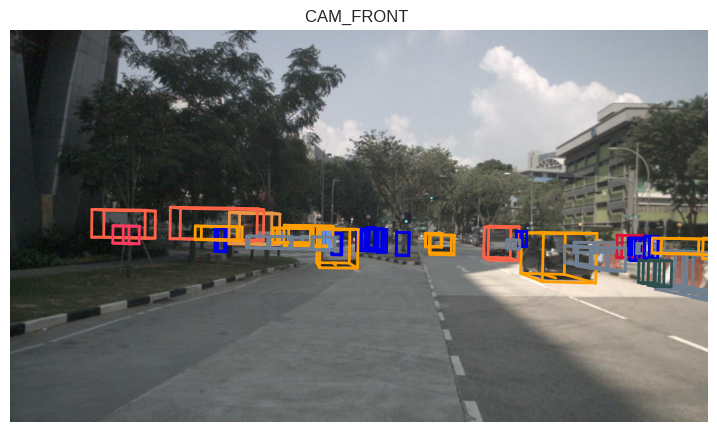

...

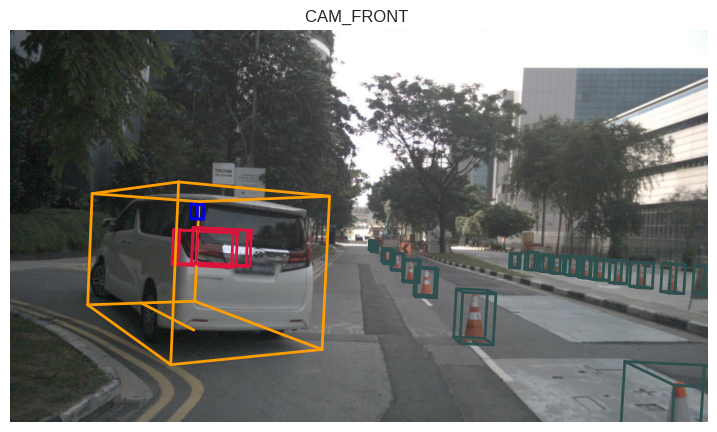

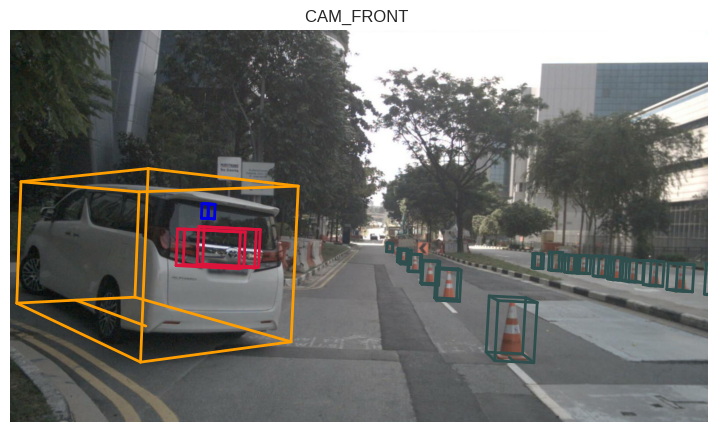

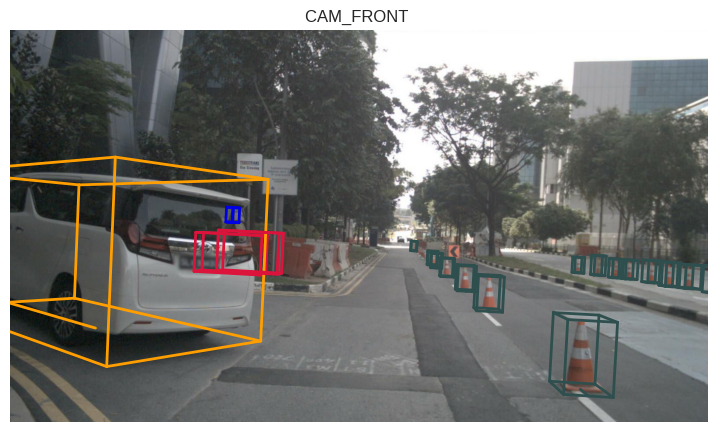

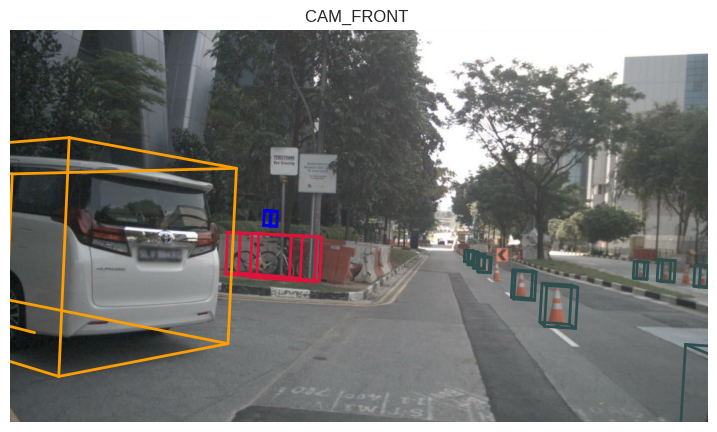

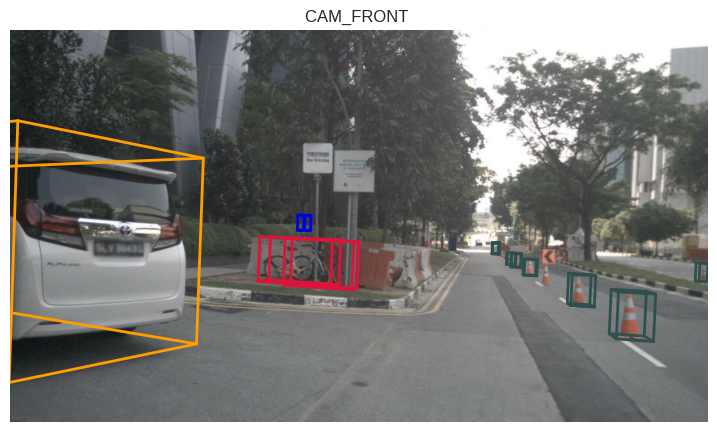

In [10]:
scene = nusc.scene[0]
sample_token = scene['first_sample_token']

while sample_token != "":
    sample = nusc.get('sample', sample_token)
    cam_token = sample['data']['CAM_FRONT']

    nusc.render_sample_data(cam_token, with_anns=True, axes_limit=40)

    sample_token = sample['next']